# The Sequence to Sequence Framework

## Sequence to Sequence theory 

Prerequisites

In [1]:
from jupyterthemes import get_themes
from jupyterthemes.stylefx import set_nb_theme
themes = get_themes()
set_nb_theme(themes[3])

In [2]:
import sys
sys.path.append('../')
sys.path.append('../seq2seq_regression/')
sys.path.append('../plouffe/')
import tensorflow as tf
from tensorflow.contrib.rnn import LSTMCell, LSTMStateTuple, GRUCell
from decoder import simple_decoder_fn_train, regression_decoder_fn_inference, dynamic_rnn_decoder
from PlouffeLib import PlouffeGraph, PlouffeSequence, batch_up
import pandas as pd
# %matplotlib inline # allows us to display matplotlib figures inline in the notebook
import matplotlib.pyplot as plt # object-oriented plotting library
'''
set parameters for the groups given by the alias
=====   =================
Alias   Property
=====   =================
'lw'    'linewidth'
'ls'    'linestyle'
'c'     'color'
'fc'    'facecolor'
'ec'    'edgecolor'
'mew'   'markeredgewidth'
'aa'    'antialiased'
=====   =================
'''
from matplotlib import rc
import numpy as np # Matrix library
from IPython.display import HTML # For video inline
import networkx as nx # imports our go to graph theory package in python
import Seq2SeqRegression
from matplotlib.animation import FuncAnimation

## Introduction

In this notebook we demonstrate the structure of the computational graph that is built to run the sequence to sequence framework.
Our sequence to sequence framework is general purpose in that it can take any sequence of vectors $v \in \mathbb{R}^N$. Here we explain how our framework can be used to analyze our system of study, the Plouffe graph.

First we set the hyperparameters. For interactive demonstration we will consider how a single sequence get's propagated through the network.

In [3]:
session = tf.InteractiveSession()

In [4]:
# Hyperparameters
num_frames = 200
num_nodes = 40
batch_size = 10
cell_size = 64

In [5]:
encoder_input_ph = tf.placeholder(dtype=tf.float32, shape=(None, num_frames, num_nodes), name = 'encoder_input')
# The is_validation placeholder is used to specify whether teacher forcing is enforced or not
is_validation = tf.placeholder(tf.bool, name='is_validation')

First we have to preprocess the input sequence such that it is time major. We also fetch the length of the sequences and we get the time-translated input and target for training the decoder.

In [6]:
encoder_input, seq_length, decoder_input, decoder_target = Seq2SeqRegression.preprocess(encoder_input_ph,
                                                                                        num_frames,
                                                                                        batch_size,
                                                                                        num_nodes)

We initialize our encoder using the dynamic rnn class from the rnn library in Tensorflow.

In [7]:
encoder_output, encoder_state = Seq2SeqRegression.init_simple_encoder(LSTMCell(cell_size),
                                                                      encoder_input,
                                                                      seq_length)

Here we grab the last output vector, $\mathcal{c}$ of the encoder module. This vector is often called the context vector and it acts as a fixed length vector representation of our sequence. 

In [8]:
context_vector = encoder_output[-1]

For the decoder we compile two seperate subgraphs. 
    - One that trains the neural network using a technique known as teacher forcing where the actual target output for the last timestep is fed as the input to the RNN at each timestep.
    - One that trains the neural network in a way that is more similar to how it is run during inference. 

In [9]:
decoder_logits_train = Seq2SeqRegression.decoder_teacher_forcing(LSTMCell(cell_size),
                                                                 context_vector,
                                                                 encoder_state,
                                                                 decoder_target,
                                                                 seq_length,
                                                                 num_nodes)

In [10]:
decoder_logits_test = Seq2SeqRegression.decoder_inference(LSTMCell(cell_size),
                                                          context_vector,
                                                          encoder_state,
                                                          batch_size,
                                                          num_frames,
                                                          num_nodes)

We train the sequence to sequence network by randomly mixing teacher forcing with no teacher forcing.
On validation we want to gain an understanding of how much our model generalizes to unseen data, so in this case we do not apply teacher forcing. 

In [11]:
is_teacher_forcing = tf.logical_or(Seq2SeqRegression.sample_Bernoulli(0.5), is_validation)

We let the `is_teacher_forcing` boolean determine which variable we prefer

In [12]:
decoder_logits = tf.where(is_teacher_forcing, decoder_logits_train, decoder_logits_test)

The network is optimized with the Adam optimizer

In [13]:
loss, train_op = Seq2SeqRegression.init_optimizer(decoder_logits, decoder_target)

We need the values to be between 0 and 1 to be easy to parameterize with a network for regression

In [14]:
decoder_prediction = decoder_logits*num_nodes

The network can be easily trained by making an iterator for the dataset of choice. 

In `PlouffeLib.py` we have done so for the Plouffe data

Here is a single sequence from the dataset

In [15]:
G = PlouffeSequence(num_nodes, 0, 5, num_frames)
anim = FuncAnimation(G.fig, G.next_frame, frames=num_frames, blit=True)
HTML(anim.to_html5_video())

In [ ]:
Seq2SeqRegression.restore_checkpoint_variables(session, check)

In [60]:
plouffe_seq = [[[int(i*k) for i in range(num_nodes)] for k in np.arange(0,5,5/float(num_frames))]]

In [20]:
anim = FuncAnimation(G.fig, G.next_frame, frames=num_frames, blit=True)

NameError: name 'G' is not defined

In [61]:
plouffe_g_5 = PlouffeGraph(num_nodes,5)

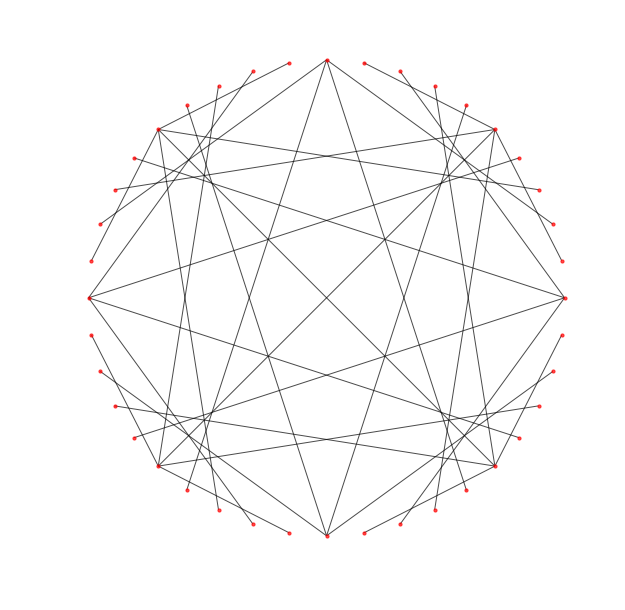

In [62]:
plouffe_g_5.draw()

In [64]:
G = PlouffeSequence(num_nodes, 0, 5, num_frames)
anim = FuncAnimation(G.fig, G.next_frame, frames=num_frames, blit=True)
HTML(anim.to_html5_video())

In [58]:
Plouffe98102

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 1, 1, 1, 1, 2, 2],
 [0, 0, 1, 1, 2, 2, 3, 3, 4, 4],
 [0, 0, 1, 2, 3, 3, 4, 5, 6, 6],
 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [0, 1, 2, 3, 5, 6, 7, 8, 10, 11],
 [0, 1, 3, 4, 6, 7, 9, 10, 12, 13],
 [0, 1, 3, 5, 7, 8, 10, 12, 14, 15],
 [0, 2, 4, 6, 8, 10, 12, 14, 16, 18],
 [0, 2, 4, 6, 9, 11, 13, 15, 18, 20],
 [0, 2, 5, 7, 10, 12, 15, 17, 20, 22],
 [0, 2, 5, 8, 11, 13, 16, 19, 22, 24],
 [0, 3, 6, 9, 12, 15, 18, 21, 24, 27],
 [0, 3, 6, 9, 13, 16, 19, 22, 26, 29],
 [0, 3, 7, 10, 14, 17, 21, 24, 28, 31],
 [0, 3, 7, 11, 15, 18, 22, 26, 30, 33],
 [0, 4, 8, 12, 16, 20, 24, 28, 32, 36],
 [0, 4, 8, 12, 17, 21, 25, 29, 34, 38],
 [0, 4, 9, 13, 18, 22, 27, 31, 36, 40],
 [0, 4, 9, 14, 19, 23, 28, 33, 38, 42]]

What is novel about the structure of our sequence to sequence framework?

What is novel about the structure of our sequence to sequence framework

We emphasize brevity and a level of abstraction that matches the mathematical way of thinking about the model.

We propose a functional API that can be easily extended for different datasets. Such datasets may include,
    - Timeseries
    - Videos
    - Anything else, where it may  be useful to use sequence to sequence as a feature extractor.

Here we will demonstrate the level of abstraction that we choose for our model.

We demonstrate how the Plouffe Graph can be analyzed with the sequence to sequence framework.

In [26]:
session = tf.InteractiveSession()

What is novel about the structure of our sequence to sequence framework?

We want to focus on how these nodes are connected in the graph.

We regard each node in the graph to be an element in the cyclic multiplicative group 
$C_N = \{ \exp({\frac{2\pi ik}{N}) : k \in \mathbb{Z}_N}\}$
where $\mathbb{Z}_N$ is the set of residue classes modulo N
$C_N$ is the multiplicative group isomorphic to $\mathbb{Z}_N$ (It's the same structure)

We fix an integer $n$.

For every node $\alpha$ we draw an edge between $\alpha$ and  $\alpha^n$ 
Maybe worth noting that $\alpha^n$ is the n-th element of the subgroup generated by $\alpha$.

As we have defined the labels for the nodes in terms of the residue classes modulo N we can formulate the connection between nodes in terms of multiplication of the labels by n.


In [8]:
dd

This is great for visualizations

show graph

In [50]:
# Taken from http://stackoverflow.com/questions/38189119/simple-way-to-visualize-a-tensorflow-graph-in-jupyter/38192374#38192374
from IPython.display import clear_output, Image, display, HTML

def strip_consts(graph_def, max_const_size=32):
    """Strip large constant values from graph_def."""
    strip_def = tf.GraphDef()
    for n0 in graph_def.node:
        n = strip_def.node.add() 
        n.MergeFrom(n0)
        if n.op == 'Const':
            tensor = n.attr['value'].tensor
            size = len(tensor.tensor_content)
            if size > max_const_size:
                tensor.tensor_content = "<stripped %d bytes>"%size
    return strip_def

def show_graph(graph_def, max_const_size=32):
    """Visualize TensorFlow graph."""
    if hasattr(graph_def, 'as_graph_def'):
        graph_def = graph_def.as_graph_def()
    strip_def = strip_consts(graph_def, max_const_size=max_const_size)
    code = """
        <script>
          function load() {{
            document.getElementById("{id}").pbtxt = {data};
          }}
        </script>
        <link rel="import" href="https://tensorboard.appspot.com/tf-graph-basic.build.html" onload=load()>
        <div style="height:600px">
          <tf-graph-basic id="{id}"></tf-graph-basic>
        </div>
    """.format(data=repr(str(strip_def)), id='graph'+str(np.random.rand()))

    iframe = """
        <iframe seamless style="width:1200px;height:620px;border:0" srcdoc="{}"></iframe>
    """.format(code.replace('"', '&quot;'))
    display(HTML(iframe))

In [ ]:
show_graph(tf.get_default_graph().as_graph_def())

In [33]:
from matplotlib.animation import FuncAnimation
plt.cla() # Clear figure

N = 200 # Set number of nodes
n_frames = 200
limit = 3
G = PlouffeSequence(N,0,limit,n_frames) # Initialize the graph G

anim = FuncAnimation(G.fig, G.next_frame,frames=n_frames, blit=True)
HTML(anim.to_html5_video())

To get a video sequence we make a list of these tensors for evolving values of k

In [8]:
last_k = 20
step = 0.5

In [10]:
import numpy as np

In [11]:
def get_Plouffe_seq(init_k, N_frames = 100, N=200):
    return np.array([np.array([int(i*cursor)%N for i in range(N)]) for cursor in np.linspace(init_k,init_k + 10, N_frames)])

In [12]:
dataset_values = np.random.randint(1,10000, 500)

In [13]:
dataset = np.array([get_Plouffe_seq(init_k) for init_k in dataset_values])

In [14]:
dataset.shape

(500, 100, 200)

In [15]:
class PlouffeIterator(object):
    def __init__(self, dataset, batch_size):
        self.dataset = dataset
        self.size = len(dataset)
        self.batch_size = batch_size
        self.cursor = 0
        self.epochs = 0
    
    def next(self):
        if (self.cursor + self.batch_size) > self.size:
            self.cursor = 0
            self.epochs += 1
        inputs = self.dataset[self.cursor:self.cursor+self.batch_size]
        outputs = self.dataset[self.cursor+1:self.cursor+self.batch_size+1]
        self.cursor += self.batch_size
        
        return inputs, outputs
        